**Universidad EAN**

**Gerencia de Proyectos**

Encuentro Final

---
**Proyecto: Detección de Empleados sin Casco en Áreas de Trabajo con YOLO**
---


Profesor:

**Carlos Isaac Zainea**


Preparado por

**Andrés Felipe Sainea Rojas**

**Laura Carolina Mateus Agudelo**

**Daniel Antonio Pérez Beltrán**



*Febrero 28, 2025*

---
# **Librerías**

---
Instalación de paquetes, importar las librerías necesarias para la ejecución del notebook

In [1]:
import gdown
import os
import torch
import yaml
import numpy as np
import shutil
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
from IPython.display import display
from PIL import Image
from sklearn.metrics import roc_curve, auc

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 89.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

---
# **Descarga y preparacion de datos**
---

Para usar este modelo se requieren imágenes que son descargadas mediante una búsqueda en ***Google Images***.  Para ello se han descargado y etiquetado 7000 imágenes.  Las imágenes se cargan a la ruta ***/content/*** en el archivo Dataset.zip, el cual será descomprimido para hacer uso de las imágenes.


El folder del dataset debe estar estructurado otros folders que serán usados como datos de entrenamiento, prueba y validación:


# ├── dataset
## └── train
#### └── images (Incluye las imágenes de entrenamiento) <br>
#### └── labels (Incluye las etiquetas de las imágenes de entrenamiento)<br>
## └── test
#### └── images (Incluye las imágenes de prueba)<br>
#### └── labels (Incluye las etiquetas de prueba)<br>
## └── val
#### └── images (Incluye las imágenes de validación)<br>
#### └── labels (Incluye las etiquetas de validación)<br>


In [2]:
file_id = "1lMC00LhK1HMoERpySn5BR5V0U9jLl-hf"
output_path = "/content/datasets.zip"

# Descargar con gdown
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_path, quiet=False)

# Verificar si el archivo es un ZIP válido antes de descomprimir
if os.path.exists(output_path) and os.path.getsize(output_path) > 1000:
    print("✅ Archivo descargado con éxito. Procediendo a descomprimir...")
    !unzip -q "/content/datasets.zip" -d "/content/datasets"
else:
    print("❌ Error: El archivo no se descargó correctamente. Verifica el enlace en Google Drive.")

Downloading...
From (original): https://drive.google.com/uc?id=1lMC00LhK1HMoERpySn5BR5V0U9jLl-hf
From (redirected): https://drive.google.com/uc?id=1lMC00LhK1HMoERpySn5BR5V0U9jLl-hf&confirm=t&uuid=8fb325ca-b4bc-4afc-8998-985a30fb0d44
To: /content/datasets.zip
100%|██████████| 264M/264M [00:04<00:00, 54.5MB/s]


✅ Archivo descargado con éxito. Procediendo a descomprimir...


### Validacion de Etiquetas

In [3]:
label_paths = ["/content/datasets/datasets/labels/train", "/content/datasets/datasets/labels/val"]

for path in label_paths:
    for file in os.listdir(path):
        if file.endswith(".txt"):
            file_path = os.path.join(path, file)
            with open(file_path, "r") as f:
                lines = f.readlines()
            new_lines = []
            for line in lines:
                parts = line.split()
                class_id = int(parts[0])
                # Si la clase es mayor a 1, corregirla a 1 (casco)
                if class_id > 1:
                    parts[0] = "1"
                new_lines.append(" ".join(parts) + "\n")
            with open(file_path, "w") as f:
                f.writelines(new_lines)

print("✅ Todas las etiquetas inválidas han sido corregidas.")

✅ Todas las etiquetas inválidas han sido corregidas.


In [4]:
# Creacion de archivo data.yaml
data = {
    'path': './datasets',  # Ruta al dataset clonado
    'train': 'images/train',
    'val': 'images/val',
    'nc': 2,
    'names': ['sin_casco', 'casco']  # Modifica según tus clases
}

with open('/content/datasets/datasets/data.yaml', 'w') as file:
    yaml.dump(data, file,
              default_flow_style=False,
              sort_keys=False)

---
# **YOLOV11**
---

YOLOv11, desarrollado por Ultralytics y presentado en 2024, es la última evolución de la familia YOLO, mejorando la precisión y velocidad en la detección de objetos en tiempo real. Con una extracción de características más avanzada y optimización para diversos entornos, es ideal para aplicaciones en dispositivos edge, la nube y sistemas con GPU. Esta versión tenía como objetivo mejorar tanto la velocidad como la precisión de las tareas de detección de objetos en comparación con sus predecesoras.

El objetivo de este trabajo es usar este modelo para detección de imágenes de trabajadores usando casco en entornos donde es obligatorio.

### Entrenamiento del modelo

Se procede a realizar el entrenamiento del modelo, el cual, se realiza mediante un comando que contiene los siguientes parámetros:

A continuación, ejecutaremos el comando para entrenar el modelo.
Repasemos los indicadores importantes en el siguiente comando:

* **data**: Ruta del archivo YAML del conjunto de datos.

* **img**: Resolución de las imágenes. De forma predeterminada es 640×640.

* **epochs**: Numero de iteraciones completas sobre el conjunto de datos durante el entrenamiento.

* **plots**: Habilita la generacion y almacenamiento de graficos relacionados con el entrenamiento.


In [5]:
model = YOLO("yolo11n.pt")
results = model.train(data="/content/datasets/datasets/data.yaml", epochs=90,imgsz=640, plots=True,batch=64, lr0=0.0005, optimizer="AdamW", patience=15)


100%|██████████| 5.35M/5.35M [00:00<00:00, 296MB/s]


Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/datasets/datasets/data.yaml, epochs=90, time=None, patience=15, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

100%|██████████| 755k/755k [00:00<00:00, 130MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/datasets/datasets/labels/train... 5269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5269/5269 [00:03<00:00, 1464.24it/s]


train: New cache created: /content/datasets/datasets/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/datasets/labels/val... 1766 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1766/1766 [00:01<00:00, 1231.29it/s]


val: New cache created: /content/datasets/datasets/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0005, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 90 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/90      8.66G      1.498      1.758      1.227        143        640: 100%|██████████| 83/83 [00:20<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:07<00:00,  1.94it/s]

                   all       1766       6808      0.159      0.781      0.467      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/90      8.63G      1.325     0.9449      1.126        130        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.31it/s]

                   all       1766       6808      0.897      0.847      0.929      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/90       8.6G       1.31     0.8528      1.114        127        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808       0.91      0.874      0.931      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/90       9.1G      1.273     0.8171      1.099        169        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808      0.918      0.861      0.933        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/90      8.99G      1.281     0.7942      1.103         82        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.27it/s]

                   all       1766       6808      0.932      0.896      0.946      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/90      8.83G      1.258     0.7744      1.096        152        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.34it/s]

                   all       1766       6808       0.91      0.881       0.93      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/90      8.73G      1.237     0.7355      1.082        138        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.936      0.902      0.953      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/90      8.86G      1.235     0.7291      1.084        145        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.937      0.902      0.951      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/90      8.71G      1.221     0.7078      1.072        129        640: 100%|██████████| 83/83 [00:18<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.33it/s]

                   all       1766       6808      0.937      0.898      0.953      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/90      9.03G      1.208     0.6949      1.071        161        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.33it/s]

                   all       1766       6808      0.942      0.902      0.956      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/90       8.6G       1.22     0.6952      1.074        150        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.30it/s]

                   all       1766       6808      0.937      0.902      0.956      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/90      8.83G      1.202     0.6828      1.066        109        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.936      0.901      0.951      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/90      8.73G      1.203     0.6791      1.067         94        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.936      0.917      0.957      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/90      8.87G      1.203     0.6758      1.062        108        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.932      0.909      0.953      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/90      8.86G      1.199     0.6668       1.06        163        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.938      0.906      0.956      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/90       8.6G      1.189     0.6646      1.057        179        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.939      0.909      0.958      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/90      9.11G      1.181     0.6574      1.056        118        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.937      0.915      0.961      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/90      8.99G      1.176     0.6477      1.054        124        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808      0.942      0.908      0.957      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/90      8.66G      1.167     0.6405      1.053        101        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.34it/s]

                   all       1766       6808      0.938       0.92      0.963      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/90      8.62G       1.17     0.6411       1.05        197        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.928      0.906      0.956      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/90      8.66G      1.167     0.6371      1.051        133        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808       0.94      0.905      0.957      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/90      8.73G      1.171     0.6342      1.047        163        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.32it/s]

                   all       1766       6808      0.942      0.913       0.96      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/90      8.67G      1.159     0.6267      1.045        118        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.935      0.922      0.961      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/90      9.01G      1.166     0.6233      1.047        121        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.934      0.917      0.962      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/90       9.3G      1.157     0.6198      1.043        152        640: 100%|██████████| 83/83 [00:18<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.947      0.918      0.963      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/90      8.87G      1.147     0.6132      1.042        117        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.33it/s]

                   all       1766       6808      0.949      0.913      0.962      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/90      8.83G      1.148     0.6175      1.042        142        640: 100%|██████████| 83/83 [00:18<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.29it/s]

                   all       1766       6808      0.945      0.917      0.964      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/90      8.74G      1.154     0.6126      1.046         86        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.943      0.913      0.963      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/90       8.9G       1.15      0.613      1.039        142        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.946       0.92      0.964       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/90      8.61G      1.146     0.6041      1.038        154        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.941      0.918      0.965      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/90      8.63G      1.133     0.5993      1.033        216        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.942      0.919      0.961      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/90      8.88G      1.139     0.5993      1.036        187        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.943       0.92      0.962      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/90      8.63G      1.131     0.5927      1.033        110        640: 100%|██████████| 83/83 [00:18<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808       0.94      0.918      0.963      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/90      8.63G       1.13     0.5897      1.034        148        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.944      0.917      0.962       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/90      8.82G      1.125     0.5904       1.03        103        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.32it/s]

                   all       1766       6808      0.941      0.919      0.964      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/90      8.64G      1.123     0.5869      1.034        130        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808      0.941      0.924      0.961      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/90       9.1G      1.126     0.5887      1.029        160        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.945       0.92      0.965       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/90      8.54G      1.124     0.5773      1.028        149        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.947      0.923      0.965      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/90      8.85G      1.122     0.5791      1.024        137        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.942      0.922      0.962      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/90      8.74G       1.12     0.5694      1.024        155        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.941      0.924      0.963      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/90      8.66G      1.108     0.5699      1.021        149        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.943      0.925      0.963      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/90      8.88G      1.111     0.5629      1.021        196        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.945      0.924      0.963      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/90      8.67G      1.103     0.5629      1.018        142        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.947      0.922      0.963      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/90      8.92G      1.107     0.5613      1.024        129        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.946      0.923      0.964      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/90      8.61G      1.102     0.5584      1.017        166        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.947      0.917      0.963      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/90      8.63G      1.096     0.5511      1.016        108        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.946      0.924      0.963      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/90       8.9G      1.086       0.55      1.015        188        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.34it/s]

                   all       1766       6808      0.945      0.926      0.962      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/90      8.87G      1.099     0.5526      1.017        148        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.947      0.922      0.962      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/90       8.6G      1.085     0.5461      1.014        130        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.945      0.926      0.962      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/90      8.61G      1.088      0.545      1.015        149        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.947      0.924      0.965      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/90      9.09G      1.092     0.5462      1.014        147        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.947      0.926      0.963      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/90      9.28G       1.08     0.5389      1.009        143        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808       0.95       0.92      0.965      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/90      8.64G      1.075     0.5372      1.005        145        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.948      0.919      0.964      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/90       8.6G      1.079     0.5355       1.01        117        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.948      0.924      0.963      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/90      8.63G      1.072     0.5306      1.005        117        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.34it/s]

                   all       1766       6808      0.945      0.925      0.964      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/90      8.85G      1.067     0.5254      1.006        117        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808      0.942      0.929      0.966      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/90      8.63G      1.076     0.5306      1.006        128        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.951      0.918      0.965      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/90      9.04G      1.069     0.5264      1.005        165        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.33it/s]

                   all       1766       6808      0.944      0.927      0.964      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/90      8.91G      1.064     0.5236      1.002        121        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.944      0.929      0.964      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/90      9.01G       1.07     0.5259      1.005        126        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.946      0.926      0.964      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/90      8.54G      1.059     0.5186      1.003        129        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808       0.94      0.923      0.964      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/90      8.53G      1.054     0.5111      1.003        123        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.941      0.929      0.963      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/90      8.67G      1.058     0.5167     0.9998        130        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.946      0.927      0.965      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/90      9.08G      1.054      0.513     0.9981        118        640: 100%|██████████| 83/83 [00:18<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.947      0.921      0.963      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/90       8.6G      1.047     0.5113     0.9961        173        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.942      0.927      0.964      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/90      9.01G      1.045     0.5101     0.9987        161        640: 100%|██████████| 83/83 [00:18<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.948      0.921      0.965      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/90      8.63G      1.043     0.5061     0.9927        149        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.951      0.924      0.965      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/90      8.95G      1.047     0.5088     0.9968        168        640: 100%|██████████| 83/83 [00:18<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.947      0.923      0.965       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/90      8.61G       1.04     0.5021     0.9936        157        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.948      0.926      0.965      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/90      9.13G      1.033     0.4983     0.9917        101        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.41it/s]

                   all       1766       6808      0.948      0.926      0.965      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/90      8.91G      1.034     0.4971     0.9918        133        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.949      0.922      0.964      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/90      8.63G      1.039     0.5007     0.9883        132        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808       0.95       0.92      0.963      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/90      8.84G      1.033     0.4957     0.9917        140        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.949      0.921      0.963      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/90      8.88G       1.03     0.4944     0.9874        112        640: 100%|██████████| 83/83 [00:18<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.944      0.924      0.963      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/90      9.13G      1.028     0.4908     0.9875        112        640: 100%|██████████| 83/83 [00:18<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808      0.947      0.924      0.964      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/90      8.72G      1.024     0.4884     0.9857        140        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.34it/s]

                   all       1766       6808      0.944      0.927      0.963      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/90      8.71G      1.019     0.4879     0.9874        101        640: 100%|██████████| 83/83 [00:18<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.34it/s]

                   all       1766       6808       0.94      0.928      0.963      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/90      8.63G      1.024     0.4835     0.9839        174        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808       0.95      0.922      0.963      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/90       8.6G      1.016     0.4852     0.9826        180        640: 100%|██████████| 83/83 [00:18<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.40it/s]

                   all       1766       6808      0.952       0.92      0.964      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/90      8.61G      1.015     0.4816      0.985         93        640: 100%|██████████| 83/83 [00:18<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808       0.95      0.921      0.964       0.68


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      81/90      8.53G      1.005     0.4388     0.9863         62        640: 100%|██████████| 83/83 [00:20<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.36it/s]

                   all       1766       6808      0.947      0.924      0.962      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      82/90      8.53G     0.9889     0.4238     0.9786         97        640: 100%|██████████| 83/83 [00:18<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.949      0.923      0.962      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      83/90      8.54G     0.9821     0.4214     0.9758         76        640: 100%|██████████| 83/83 [00:18<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.952      0.919      0.962      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      84/90      8.43G     0.9812     0.4184     0.9784         67        640: 100%|██████████| 83/83 [00:18<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.37it/s]

                   all       1766       6808      0.953      0.919      0.963      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      85/90      8.53G     0.9786     0.4185     0.9747         77        640: 100%|██████████| 83/83 [00:18<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]

                   all       1766       6808      0.949      0.921      0.962      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      86/90      8.53G     0.9741     0.4144     0.9721         95        640: 100%|██████████| 83/83 [00:18<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.952      0.919      0.963      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      87/90      8.53G     0.9746      0.412     0.9736         72        640: 100%|██████████| 83/83 [00:18<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.39it/s]

                   all       1766       6808      0.954      0.917      0.963      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      88/90      8.53G     0.9663     0.4086     0.9674         82        640: 100%|██████████| 83/83 [00:18<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.955      0.919      0.962      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      89/90      8.54G     0.9666     0.4094     0.9694         95        640: 100%|██████████| 83/83 [00:18<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.953      0.919      0.962      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      90/90      8.51G     0.9655     0.4095     0.9689        139        640: 100%|██████████| 83/83 [00:18<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.38it/s]

                   all       1766       6808      0.954      0.917      0.962      0.677
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 75, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



90 epochs completed in 0.635 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.60it/s]


                   all       1766       6808      0.948      0.924      0.964      0.681
             sin_casco        339       1803      0.941      0.935       0.97       0.69
                 casco       1604       5005      0.955      0.913      0.958      0.672
Speed: 0.1ms preprocess, 0.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


Una vez finalizado el entrenamiento, los pesos del modelo se almacenarán en la carpeta ***/content/runs/detect/train/weights/best.pt***. Por lo tanto, si se desea reutilizar el modelo, este archivo puede ser cargado y empleado para la clasificación sin necesidad de volver a entrenarlo con los mismos parámetros.

### Evaluación del modelo

A continuación se muestran los resultados de la evaluación del modelo

In [31]:
model_afinado = YOLO('/content/runs/detect/train/weights/best.pt')
evaluation = model_afinado.val()

### Imagen de Entrenamiento

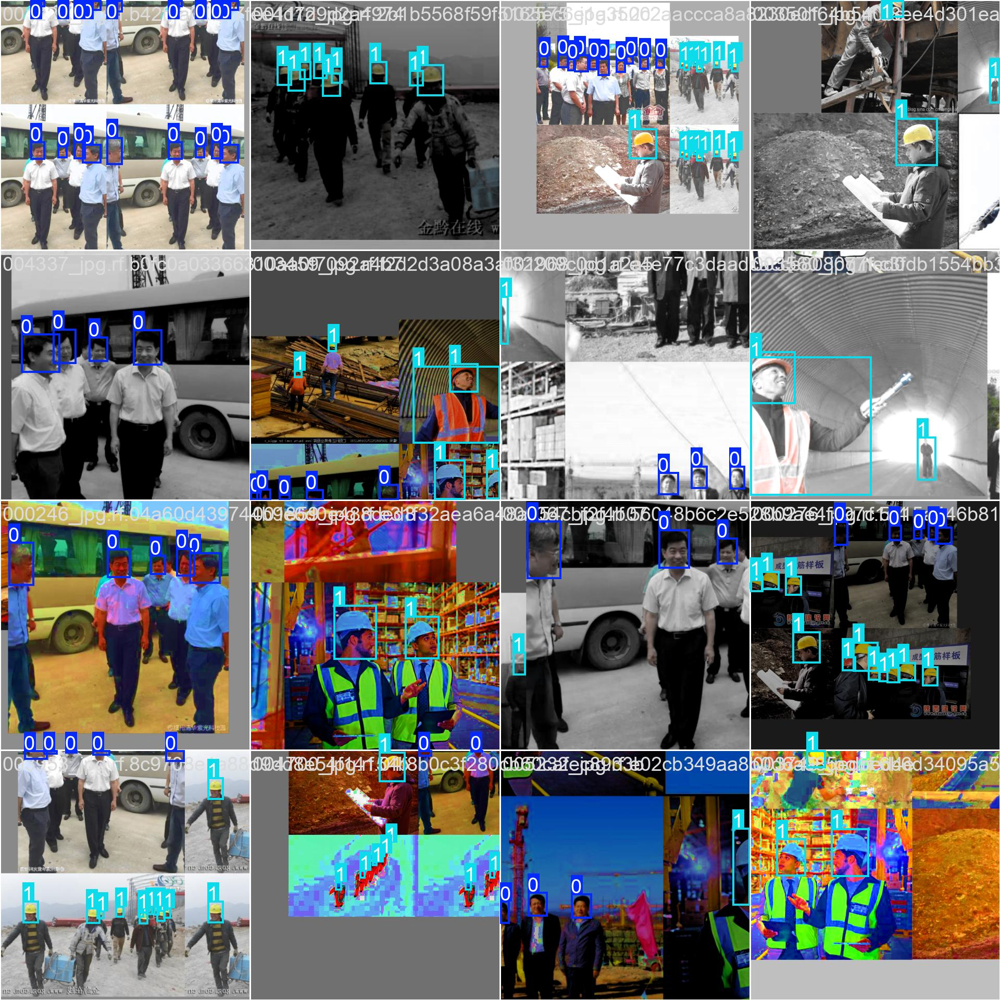

In [40]:
image_path = "/content/runs/detect/train/train_batch0.jpg"
display(Image.open(image_path))

### Metricas

In [41]:
def print_metrics(evaluation):
    print("📊 Resultados de evaluación:")
    print(f"🔹 mAP (IoU@0.5): {evaluation.box.maps[0]:.4f}")
    print(f"🔹 mAP (IoU@0.5:0.95): {evaluation.box.maps[1]:.4f}")
    print(f"🔹 Precisión: {evaluation.box.p.mean():.4f}")
    print(f"🔹 Recall: {evaluation.box.r.mean():.4f}")
    print(f"🔹 F1-score: {evaluation.box.f1.mean():.4f}")
print_metrics(evaluation)

📊 Resultados de evaluación:
🔹 mAP (IoU@0.5): 0.6902
🔹 mAP (IoU@0.5:0.95): 0.6725
🔹 Precisión: 0.9429
🔹 Recall: 0.9256
🔹 F1-score: 0.9341


In [60]:
print("Valores en p (precisión):", evaluation.box.p)
print("Valores en r (recall):", evaluation.box.r)

Valores en p (precisión): [    0.93678     0.94909]
Valores en r (recall): [    0.93691     0.91429]


### Generacion y Muestra de predicciones

In [56]:
preds = model_afinado('/content/datasets/datasets/images/test', conf=0.3)


image 1/75 /content/datasets/datasets/images/test/000002.jpg: 384x640 3 cascos, 13.6ms
image 2/75 /content/datasets/datasets/images/test/000004.jpg: 448x640 2 cascos, 10.8ms
image 3/75 /content/datasets/datasets/images/test/000005.jpg: 480x640 3 cascos, 10.7ms
image 4/75 /content/datasets/datasets/images/test/000006.jpg: 544x640 2 cascos, 10.7ms
image 5/75 /content/datasets/datasets/images/test/000007.jpg: 480x640 5 cascos, 10.6ms
image 6/75 /content/datasets/datasets/images/test/000008.jpg: 480x640 1 sin_casco, 10.0ms
image 7/75 /content/datasets/datasets/images/test/000009.jpg: 448x640 2 cascos, 10.7ms
image 8/75 /content/datasets/datasets/images/test/000010.png: 448x640 3 cascos, 10.0ms
image 9/75 /content/datasets/datasets/images/test/000012.jpg: 448x640 2 cascos, 9.9ms
image 10/75 /content/datasets/datasets/images/test/000013.jpg: 416x640 3 cascos, 10.4ms
image 11/75 /content/datasets/datasets/images/test/000014.jpg: 480x640 1 casco, 10.5ms
image 12/75 /content/datasets/datasets/

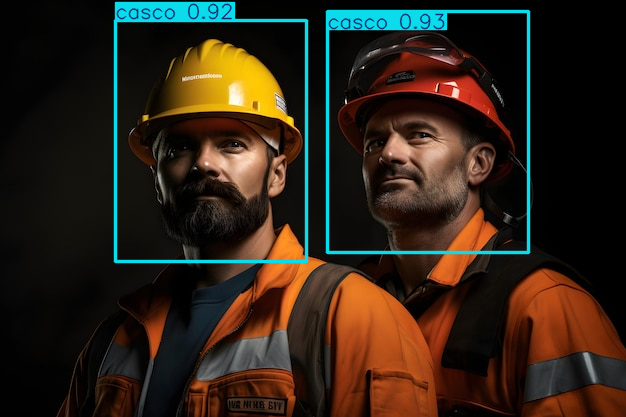

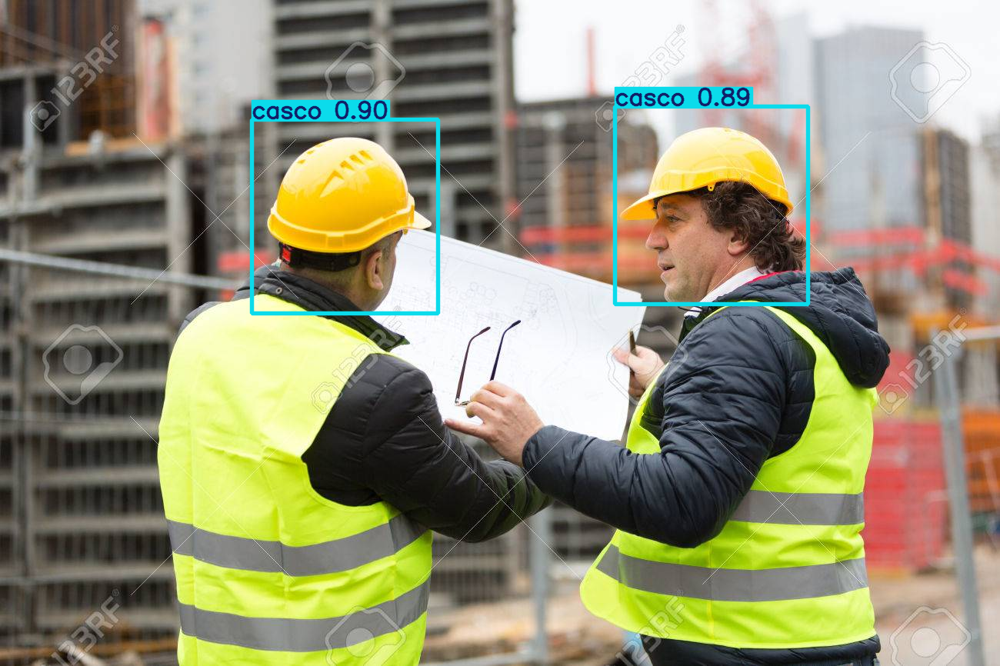

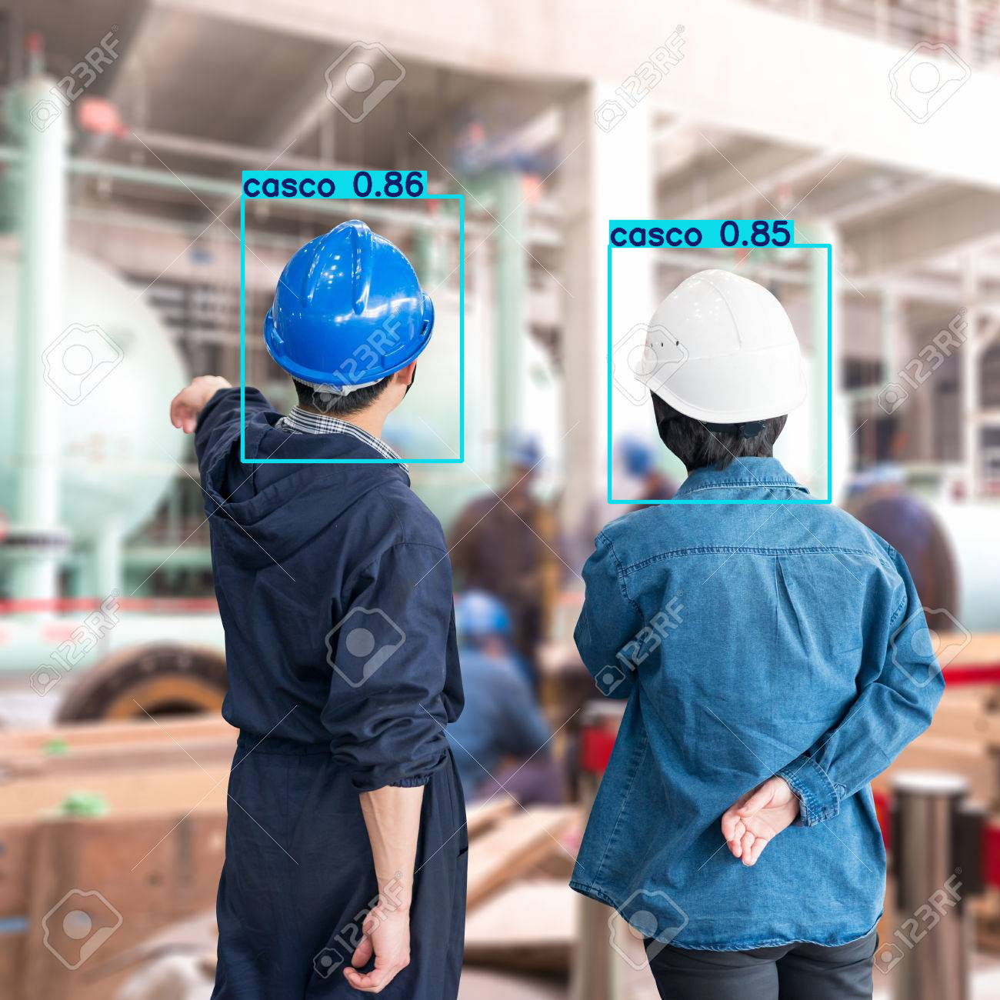

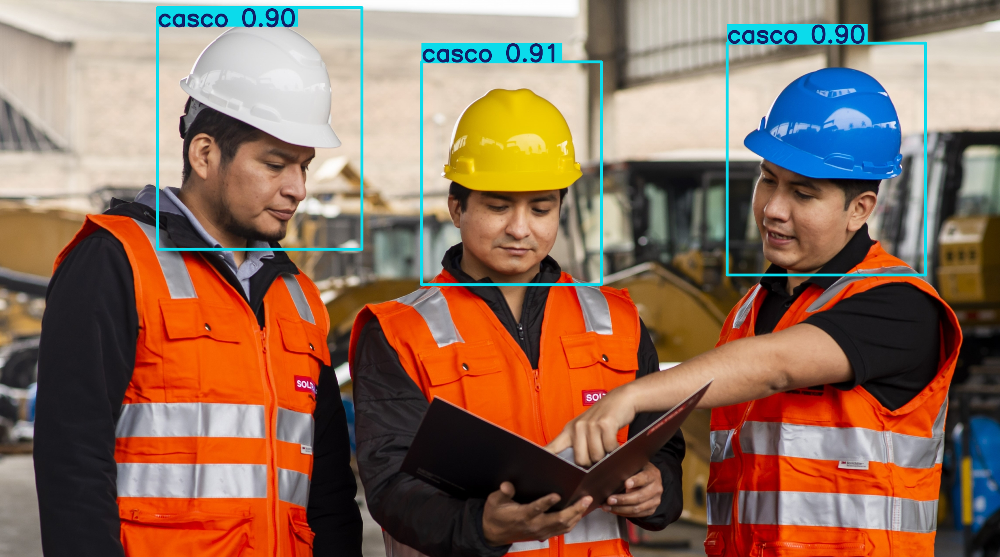

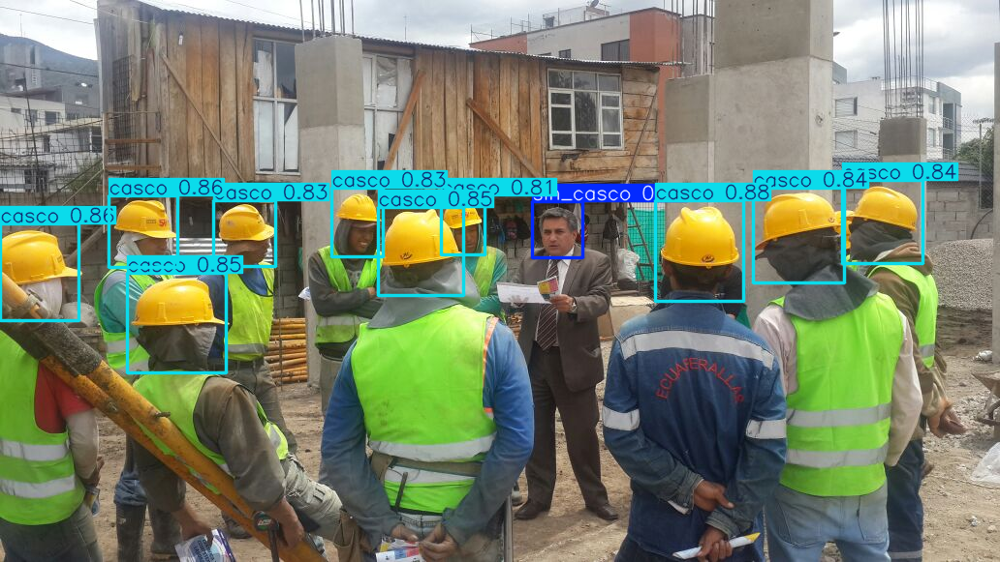

In [57]:
preds[1].show()
preds[11].show()
preds[21].show()
preds[31].show()
preds[67].show()

### Matriz de Confusion

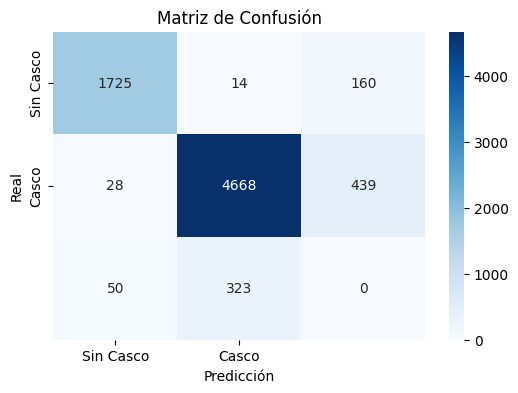

In [50]:
conf_matrix = evaluation.confusion_matrix.matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt=".0f", cmap="Blues", xticklabels=["Sin Casco", "Casco"], yticklabels=["Sin Casco", "Casco"])
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.title("Matriz de Confusión")
plt.show()

### Curva ROC

y_true: [1 1 1 1 1 1 1 1 1 1]
y_scores: [    0.90523     0.90485     0.89702     0.92867     0.91651     0.84718     0.83135     0.80471     0.88511      0.8744]


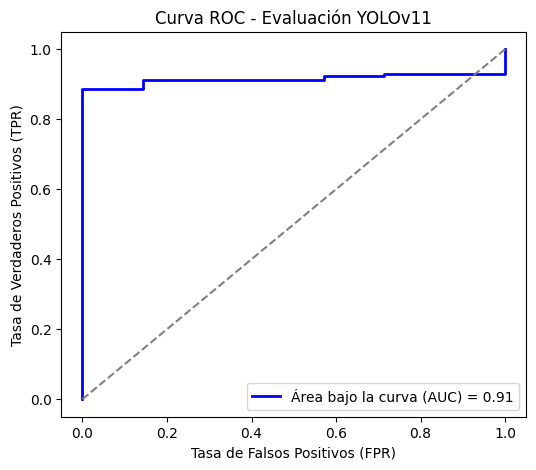

In [52]:
y_true, y_scores = [], []
for pred in preds:
    for box in pred.boxes:
        y_true.append(int(box.cls.item()))
        y_scores.append(float(box.conf.item()))

y_true = np.array(y_true)
y_scores = np.array(y_scores)

# Verificar dimensiones
print("y_true:", y_true[:10])  # Primeras 10 etiquetas reales
print("y_scores:", y_scores[:10])  # Primeras 10 probabilidades

if len(y_true) > 0 and len(y_scores) > 0:
    fpr, tpr, _ = roc_curve(y_true, y_scores, pos_label=1)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área bajo la curva (AUC) = {roc_auc:.2f}')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel("Tasa de Falsos Positivos (FPR)")
    plt.ylabel("Tasa de Verdaderos Positivos (TPR)")
    plt.title("Curva ROC - Evaluación YOLOv11")
    plt.legend(loc="lower right")
    plt.show()
else:
    print("⚠️ No se pudo generar la curva ROC debido a valores incorrectos.")

In [62]:
import shutil

# Comprimir la carpeta runs
shutil.make_archive("/content/runs", "zip", "/content/runs")

# Descargar el archivo comprimido
from google.colab import files
files.download("/content/runs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>